In [32]:
!pip install transformers==4.28.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [33]:
!pip install  nltk openpyxl dataset evaluate sentence-transformers ktrain nlpaug

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install lime transformers-interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 76.7 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=b315e478cd107e5fedfa21186fc9722b48f33073187722fff73bc5c064c9489a
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [34]:
import logging
import pandas as pd
import numpy as np
from numpy import random
# import gensim
import nltk
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
import re
%matplotlib inline
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Clase'].unique()

# extract subdataframe selecting columns
df1 = df[['Clase', 'Orden', 'Familia', 'Género', 'Especie', 'Descripción']]
df1 = df1.reset_index(drop=True)
df1 = df1[df1['Descripción'].notna()]


In [ ]:
df1

,Clase,Orden,Familia,Género,Especie,Descripción
0,Merostomata,Xiphosura,Limulidae,Limulus,polyphemus,La cacerola de las Molucas es un verdadero ...
1,Pycnogonida,NaN,Colossendeidae,Colossendeis,sp.,Su nombre significa todo patas. ...
2,Pycnogonida,NaN,Nymphonidae,Nymphon,sp.,Este picnognónido es un animal marino ...
3,Arachnida,Uropygi,Thelyphonidae,Typopeltis,stimpsoni,La mayor particularidad del Typopeltis...
4,Arachnida,Araneae,Araneidae,Argiope,bruennichi,"Esta magnífica araña abunda en toda Europa, ..."
...,...,...,...,...,...,...
1617,Insecta,Lepidoptera,Geometridae,Scopula,rufomixtaria,Este pequeño geométrido presenta las alas a...
1618,Insecta,Odonata,Libellulidae,Trithemis,aurora,Es una libélula de tamaño mediano que se en...
1619,Insecta,Coleoptera,Chrysomelidae,Cassida,rubiginosa,La casida de los cardos es de color verde b...
1620,Insecta,Coleoptera,Curculionidae,Aulacobaris,cuprirostris,Este hermoso gorgojo mide de tres a cuatro ...


<Axes: >

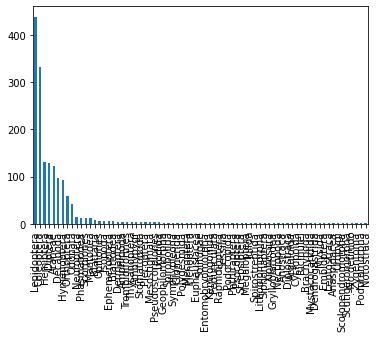

In [ ]:
df1
import matplotlib.pyplot as plt
# plot the number of elements in column Orden
df1['Orden'].value_counts().plot(kind='bar')
# new dtaframe withouth rows where Orden is lepidoptera
# df2 = df1[df1['Orden'] == ' LEPIDOPTERA']


In [ ]:
# remove all rows where Descripcion does not star with 'Descripción'
df1 = df1[df1['Descripción'].str.startswith('Descripción')]
#add the string in the column Nombre comun to Descripcion
df1['Descripcion'] = df1['Nombre común'] + ' ' + df1['Descripción']
df1=df1.reset_index() 
df1[['Genero','Especie']]







KeyError: 'Nombre común'

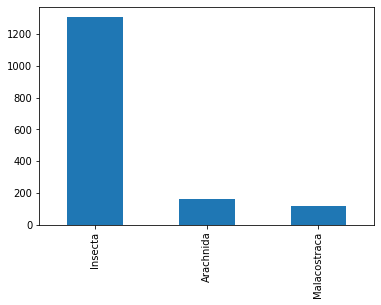

In [ ]:
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Descripción'] = df['Descripción'].apply(clean_text)
df1 = df[df['Clase'].isin(['Insecta', 'Arachnida', 'Malacostraca'])]
df2 = df1[['Clase', 'Descripción']]
df2['Clase'].value_counts()

# # divide the string in the column Descripcion in half and store the second half in the column Descripcion2
# for index, row in df1.iterrows():
#     if row['Clase'] == 'Arachnida':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)
#     if row['Clase'] == 'Malacostraca':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)

        



# plot the number of elements in column Clase
df2['Clase'].value_counts().plot(kind='bar')
df1 = df2

<ipython-input-81-d43f3558ae05>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Clase': cls}, ignore_index=True)
<ipython-input-81-d43f3558ae05>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Clase': cls}, ignore_index=True)
<ipython-input-81-d43f3558ae05>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Clase': cls}, ignore_index=True)
<ipython-input-81-d43f3558ae05>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Clase': cls}, ign

<Axes: >

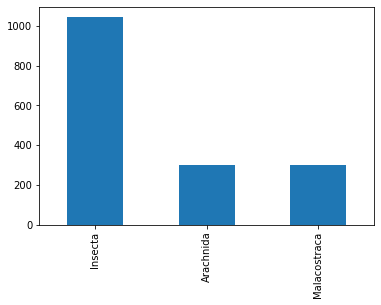

In [ ]:
import pandas as pd
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw


df_tain, test_df = train_test_split(df2, test_size=0.2, random_state=42)

class_counts = df_tain['Clase'].value_counts()
desired_count = 300
new_df = pd.DataFrame(columns=df_tain.columns)
for cls in class_counts.index:
    cls_df = df_tain[df_tain['Clase'] == cls]
    aug = naw.SynonymAug(aug_src='wordnet', lang='spa')
    cls_size = len(cls_df)
    while cls_size < desired_count:
        # Augment a random instance of the class
        idx = cls_df.sample().index[0]
        aug_text = aug.augment(df_tain.loc[idx, 'Descripción'])[0]
        # Add the augmented instance to the new dataframe
        new_df = new_df.append({'Descripción': aug_text, 'Clase': cls}, ignore_index=True)
        cls_size += 1
balanced_df = pd.concat([df_tain, new_df], ignore_index=True)

balanced_df['Clase'].value_counts().plot(kind='bar')

In [ ]:
# df1=balanced_df
X = df1.Descripción
y = df1.Clase
X_train, y_train = X, y
X_test,y_test = test_df.Descripción,test_df.Clase

NameError: ignored

In [ ]:
df1.Clase.unique()

array(['Insecta', 'Arachnida', 'Malacostraca'], dtype=object)

In [ ]:
X

0       insecto tres centmetros longitud cinco enverga...
1       pequeos escarabajos presentan cuerpo aplanado ...
2       adultos crecen 60 milmetros largo color amaril...
3       adultos curiosa mariposa cierto parecido avisp...
4       escarabajo goliat coleptero ms pesado pues roz...
                              ...                        
1638    cangrejo cocoteros puede pesar ms dos kilogram...
1639    pequeo crustceo apenas alcanza cinco centmetro...
1640    animal presenta caparazn forma triangular vrti...
1641    cangrejo presenta caparazn aplastado ligeramen...
1642    pequeos crustceos constituyen alimento grandes...
Name: Descripción, Length: 1643, dtype: object

Naive Bayes Classifier for Multinomial Models

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Clase.unique()))

accuracy 0.8607594936708861
              precision    recall  f1-score   support

     Insecta       1.00      0.09      0.17        33
   Arachnida       0.86      1.00      0.92       263
Malacostraca       1.00      0.30      0.46        20

    accuracy                           0.86       316
   macro avg       0.95      0.46      0.52       316
weighted avg       0.88      0.86      0.81       316



Linear support vector machine

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Clase.unique()))

accuracy 0.9715189873417721
              precision    recall  f1-score   support

     Insecta       1.00      0.76      0.86        33
   Arachnida       0.97      1.00      0.98       263
Malacostraca       1.00      0.95      0.97        20

    accuracy                           0.97       316
   macro avg       0.99      0.90      0.94       316
weighted avg       0.97      0.97      0.97       316



logistic regrassion

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Clase.unique()))

accuracy 0.9746835443037974
              precision    recall  f1-score   support

     Insecta       1.00      0.79      0.88        33
   Arachnida       0.97      1.00      0.99       263
Malacostraca       1.00      0.95      0.97        20

    accuracy                           0.97       316
   macro avg       0.99      0.91      0.95       316
weighted avg       0.98      0.97      0.97       316



BERT-based classifier

In [ ]:
# get a new column called label with numeric values for the column facultades
df1['label'] = df1['Clase'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df1, test_size=0.2, random_state=42)

In [ ]:
train_texts, train_labels = train['Descripción'].tolist(), train['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [ ]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2)

In [ ]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [ ]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [ ]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
id2label = dict(zip(df1['label'].unique(),df1['Clase'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [ ]:
id2label

{1: 'Insecta', 0: 'Arachnida', 2: 'Malacostraca'}

In [ ]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=3,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.bias', 'lm_head.decoder.bias', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.out_proj.weight', 'classi

device(type='cuda', index=0)

In [ ]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)




In [ ]:
from transformers import TrainingArguments, Trainer
from torch import nn
from sklearn.utils import class_weight

training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=6,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy
1,0.382500,0.081260,0.980989
2,0.059200,0.021060,0.996198
3,0.009700,0.036447,0.992395
4,0.001200,0.021928,0.996198
5,0.000800,0.023026,0.996198
6,0.000800,0.023335,0.996198


TrainOutput(global_step=792, training_loss=0.07568584898053998, metrics={'train_runtime': 445.7874, 'train_samples_per_second': 14.146, 'train_steps_per_second': 1.777, 'total_flos': 1176342062550732.0, 'train_loss': 0.07568584898053998, 'epoch': 6.0})

In [ ]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

('CustomModels/robertabne_trained_on_insectos_orden_aug/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/tokenizer.json')

In [ ]:
# load the model
device='cuda'
from datasets import Dataset
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification, pipeline
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

In [ ]:
test_df = test_df.rename(columns={'Descripción': 'text'})
test_df['label'] = test_df['Clase'].map(label2id)
dataset = Dataset.from_pandas(test_df[['text','label']])


In [ ]:
test_df

,Clase,text,label
3898,Insecta,saltamontes cuerpo alargado rostro sesgado lar...,1
2951,Insecta,longitud corporal 12 milmetros insecto animal ...,1
3766,Insecta,pequeo saltamontes antenas cortas mide ms cent...,1
1581,Insecta,moscas apenas centmetro tamao presentan aspect...,1
1188,Insecta,avispas ponen huevos interior rosales inducien...,1
...,...,...,...
3639,Insecta,escarabajo presenta cuerpo alargado color negr...,1
3847,Arachnida,araas cangrejo presentan coloracin pardo claro...,0
3713,Insecta,mariposa pertenece familia lepidpteros nocturn...,1
4224,Insecta,hormiga terciopelo rojo realidad avispa largas...,1


In [ ]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden_aug")

In [ ]:
tokenizer = load_tokenizer
model = load_model

In [ ]:
label = []
results = []
for index,row in test_df.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['text'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [ ]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




{'precision': 0.9682001238345588}


{'f1': 0.9677483984981943}


{'recall': 0.9683544303797469}
{'accuracy': 0.9683544303797469}


In [ ]:
test

,Clase,text,label
233,Insecta,Se trata de un escarabajo inconfundible por...,1
450,Insecta,Esta mariposa se encuentra en toda la Penín...,1
1240,Insecta,Este pequeño lepidóptero es una terrible pl...,1
1693,Malacostraca,"caparazón, que hace que parezca que tienen el...",2
411,Insecta,Las larvas de estos animales se alimen...,1
...,...,...,...
471,Insecta,Esta mariposa habita en los lugares más ...,1
777,Insecta,Los dos sexos de estas bellas mariposas mue...,1
413,Insecta,Esta mariposa nocturna de coloración...,1
271,Insecta,Se trata de un esbelto mosquito de alas cri...,1


# con ordenes

In [ ]:
a = ['Lepidoptera',
 'Coleoptera',
 'Hemiptera',
 'Diptera',
 'Araneae',
 'Decapoda',
 'Hymenoptera',
 'Orthoptera']

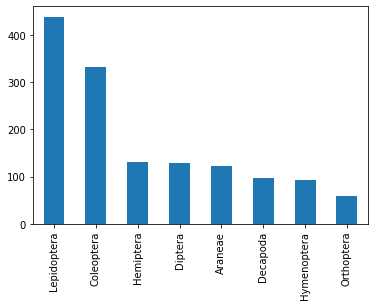

In [ ]:
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Descripción'] = df['Descripción'].apply(clean_text)
df1 = df[df['Orden'].isin(a)]
df2 = df1[['Orden', 'Descripción']]
df2['Orden'].value_counts()

# # divide the string in the column Descripcion in half and store the second half in the column Descripcion2
# for index, row in df1.iterrows():
#     if row['Clase'] == 'Arachnida':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)
#     if row['Clase'] == 'Malacostraca':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)

        



# plot the number of elements in column Clase
df2['Orden'].value_counts().plot(kind='bar')
df1 = df2

In [ ]:
df2['Orden'].value_counts()

Lepidoptera    439
Coleoptera     332
Hemiptera      131
Diptera        129
Araneae        122
Decapoda        97
Hymenoptera     92
Orthoptera      59
Name: Orden, dtype: int64

In [ ]:
import pandas as pd
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw


df_tain, test_df = train_test_split(df2, test_size=0.2, random_state=42)

class_counts = df_tain['Orden'].value_counts()
desired_count = 200
new_df = pd.DataFrame(columns=df_tain.columns)
for cls in class_counts.index:
    cls_df = df_tain[df_tain['Orden'] == cls]
    aug = naw.SynonymAug(aug_src='wordnet', lang='spa')
    cls_size = len(cls_df)
    while cls_size < desired_count:
        # Augment a random instance of the class
        idx = cls_df.sample().index[0]
        aug_text = aug.augment(df_tain.loc[idx, 'Descripción'])[0]
        # Add the augmented instance to the new dataframe
        new_df = new_df.append({'Descripción': aug_text, 'Orden': cls}, ignore_index=True)
        cls_size += 1
balanced_df = pd.concat([df_tain, new_df], ignore_index=True)

balanced_df['Orden'].value_counts().plot(kind='bar')

In [ ]:
df1=balanced_df
X = df1.Descripción
y = df1.Orden
X_train, y_train = X, y
X_test,y_test = test_df.Descripción,test_df.Orden

In [ ]:
X = df1.Descripción
y = df1.Orden
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Orden.unique()))

accuracy 0.5463182897862233
              precision    recall  f1-score   support

     Araneae       0.00      0.00      0.00        33
    Decapoda       0.70      0.85      0.77       112
 Hymenoptera       1.00      0.03      0.07        29
  Orthoptera       0.00      0.00      0.00        40
   Hemiptera       0.00      0.00      0.00        28
  Coleoptera       0.00      0.00      0.00        29
     Diptera       0.47      1.00      0.64       134
 Lepidoptera       0.00      0.00      0.00        16

    accuracy                           0.55       421
   macro avg       0.27      0.24      0.18       421
weighted avg       0.40      0.55      0.41       421



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Orden.unique()))

accuracy 0.9477434679334917
              precision    recall  f1-score   support

     Araneae       0.97      1.00      0.99        33
    Decapoda       0.91      0.99      0.95       112
 Hymenoptera       1.00      0.79      0.88        29
  Orthoptera       0.97      0.93      0.95        40
   Hemiptera       0.96      0.89      0.93        28
  Coleoptera       0.96      0.79      0.87        29
     Diptera       0.95      1.00      0.97       134
 Lepidoptera       1.00      0.81      0.90        16

    accuracy                           0.95       421
   macro avg       0.97      0.90      0.93       421
weighted avg       0.95      0.95      0.95       421



In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Orden.unique()))

accuracy 0.9501187648456056
              precision    recall  f1-score   support

     Araneae       1.00      1.00      1.00        33
    Decapoda       0.92      0.99      0.95       112
 Hymenoptera       1.00      0.79      0.88        29
  Orthoptera       0.95      0.95      0.95        40
   Hemiptera       0.93      0.89      0.91        28
  Coleoptera       0.96      0.76      0.85        29
     Diptera       0.96      0.99      0.97       134
 Lepidoptera       1.00      0.94      0.97        16

    accuracy                           0.95       421
   macro avg       0.96      0.91      0.94       421
weighted avg       0.95      0.95      0.95       421



In [ ]:
# get a new column called label with numeric values for the column facultades
df1['label'] = df1['Orden'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df1, test_size=0.2, random_state=42)

In [ ]:
train_texts, train_labels = train['Descripción'].tolist(), train['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [ ]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2)

In [ ]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [ ]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [ ]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
id2label = dict(zip(df1['label'].unique(),df1['Orden'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [ ]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=8,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.bias', 'lm_head.decoder.bias', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.out_proj.weight', 'classi

device(type='cuda', index=0)

In [ ]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)

In [ ]:
from transformers import TrainingArguments, Trainer
torch.cuda.empty_cache()
training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=6,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy
1,1.089500,0.333553,0.941581
2,0.153300,0.127407,0.965636
3,0.035500,0.064564,0.972509
4,0.012500,0.052208,0.979381
5,0.005800,0.053396,0.975945
6,0.005000,0.053373,0.975945


TrainOutput(global_step=876, training_loss=0.21693196668200296, metrics={'train_runtime': 518.4857, 'train_samples_per_second': 13.435, 'train_steps_per_second': 1.69, 'total_flos': 1328158514731104.0, 'train_loss': 0.21693196668200296, 'epoch': 6.0})

In [ ]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug_3")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug_3")

('CustomModels/robertabne_trained_on_insectos_orden_aug_3/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug_3/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug_3/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug_3/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden_aug_3/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug_3/tokenizer.json')

In [ ]:
# load the model
device='cuda'
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug_3")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug_3")

In [ ]:
# test = test.rename(columns={'Descripción': 'text'})
# dataset = Dataset.from_pandas(test[['text','label']])
test_df = test_df.rename(columns={'Descripción': 'text'})
test_df['label'] = test_df['Orden'].map(label2id)
dataset = Dataset.from_pandas(test_df[['text','label']])

In [ ]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden_aug_3")

In [ ]:
tokenizer = load_tokenizer
model = load_model

In [ ]:
label = []
results = []
for index,row in test_df.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['text'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [ ]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




{'precision': 0.9314070436242804}
{'f1': 0.9293658773222172}
{'recall': 0.9288256227758007}
{'accuracy': 0.9288256227758007}


In [ ]:
test

,Orden,text,label
1263,Coleoptera,Estos pequeños escarabajos presentan el cue...,1
1103,Coleoptera,Estos escarabajos son endémicos de la provi...,1
91,Decapoda,"Este langostino es, en la actualida...",2
1453,Lepidoptera,Existen varias variedades de color de esta ...,6
832,Coleoptera,Este precioso escarabajo se alimenta de las...,1
...,...,...,...
286,Diptera,Esta mosca es notable por su facilid...,3
476,Lepidoptera,Esta polilla tiene una envergadura alar ent...,6
1497,Hymenoptera,En este género se incluyen especies de entr...,5
1136,Lepidoptera,Mariposa de unos 3 centímetros de envergadura...,6


# SUPERFAMILIAS

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Clase'].unique()

# extract subdataframe selecting columns
df1 = df[['Clase', 'Orden', 'Familia', 'Género', 'Especie', 'Descripción','Superfamilia']]
df1 = df1.reset_index(drop=True)
df1 = df1[df1['Descripción'].notna()]

In [ ]:
a = ['Papilionoidea',
 'Chrysomeloidea',
 'Noctuoidea',
 'Scarabaeoidea',
 'Apoidea',
 'Bombycoidea',
 'Tenebrionoidea',
 'Pentatomoidea',
 'Syrphoidea',
 'Curculionoidea',
 'Caraboidea',
 'Vespoidea',
 'Acridoidea',
 'Cucujoidea',
 'Tettigonioidea']

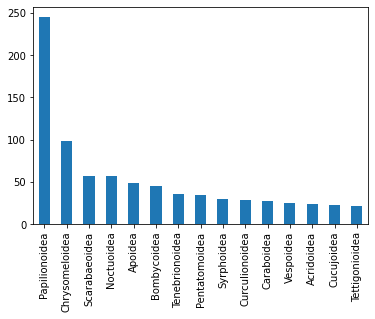

In [ ]:
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Descripción'] = df['Descripción'].apply(clean_text)
df1 = df1[df1['Superfamilia'].isin(a)]
df2 = df1[['Superfamilia', 'Descripción']]
df2['Superfamilia'].value_counts()

# # divide the string in the column Descripcion in half and store the second half in the column Descripcion2
# for index, row in df1.iterrows():
#     if row['Clase'] == 'Arachnida':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)
#     if row['Clase'] == 'Malacostraca':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)

        



# plot the number of elements in column Clase
df2['Superfamilia'].value_counts().plot(kind='bar')
df1 = df2

In [ ]:
df2['Superfamilia'].value_counts()

Papilionoidea     245
Chrysomeloidea     98
Scarabaeoidea      57
Noctuoidea         57
Apoidea            49
Bombycoidea        45
Tenebrionoidea     36
Pentatomoidea      35
Syrphoidea         30
Curculionoidea     29
Caraboidea         27
Vespoidea          25
Acridoidea         24
Cucujoidea         23
Tettigonioidea     22
Name: Superfamilia, dtype: int64

In [ ]:
X = df1.Descripción
y = df1.Superfamilia
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Superfamilia.unique()))

accuracy 0.2821576763485477
                precision    recall  f1-score   support

       Apoidea       0.00      0.00      0.00         7
 Pentatomoidea       0.00      0.00      0.00        16
    Acridoidea       0.00      0.00      0.00        16
Tettigonioidea       0.00      0.00      0.00        10
Curculionoidea       0.00      0.00      0.00        29
Tenebrionoidea       0.00      0.00      0.00         7
    Caraboidea       0.00      0.00      0.00         5
Chrysomeloidea       0.00      0.00      0.00        17
    Cucujoidea       0.28      1.00      0.44        68
 Scarabaeoidea       0.00      0.00      0.00         7
    Syrphoidea       0.00      0.00      0.00        27
     Vespoidea       0.00      0.00      0.00         8
    Noctuoidea       0.00      0.00      0.00        11
   Bombycoidea       0.00      0.00      0.00         4
 Papilionoidea       0.00      0.00      0.00         9

      accuracy                           0.28       241
     macro avg    

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Superfamilia.unique()))

accuracy 0.7468879668049793
                precision    recall  f1-score   support

       Apoidea       0.60      0.43      0.50         7
 Pentatomoidea       0.62      1.00      0.76        16
    Acridoidea       0.75      0.19      0.30        16
Tettigonioidea       0.62      0.50      0.56        10
Curculionoidea       0.64      0.86      0.74        29
Tenebrionoidea       1.00      0.86      0.92         7
    Caraboidea       0.80      0.80      0.80         5
Chrysomeloidea       0.86      0.71      0.77        17
    Cucujoidea       0.79      0.99      0.88        68
 Scarabaeoidea       0.78      1.00      0.88         7
    Syrphoidea       1.00      0.44      0.62        27
     Vespoidea       0.89      1.00      0.94         8
    Noctuoidea       0.56      0.45      0.50        11
   Bombycoidea       0.40      0.50      0.44         4
 Papilionoidea       1.00      0.56      0.71         9

      accuracy                           0.75       241
     macro avg    

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Superfamilia.unique()))

accuracy 0.7427385892116183
                precision    recall  f1-score   support

       Apoidea       0.67      0.29      0.40         7
 Pentatomoidea       0.83      0.94      0.88        16
    Acridoidea       0.80      0.25      0.38        16
Tettigonioidea       0.67      0.20      0.31        10
Curculionoidea       0.59      0.93      0.72        29
Tenebrionoidea       1.00      0.86      0.92         7
    Caraboidea       0.80      0.80      0.80         5
Chrysomeloidea       0.80      0.71      0.75        17
    Cucujoidea       0.74      0.99      0.85        68
 Scarabaeoidea       0.88      1.00      0.93         7
    Syrphoidea       0.93      0.52      0.67        27
     Vespoidea       1.00      0.75      0.86         8
    Noctuoidea       0.45      0.45      0.45        11
   Bombycoidea       0.60      0.75      0.67         4
 Papilionoidea       1.00      0.56      0.71         9

      accuracy                           0.74       241
     macro avg    

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# get a new column called label with numeric values for the column facultades
df1['label'] = df1['Superfamilia'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df1, test_size=0.2, random_state=42)

In [ ]:
train_texts, train_labels = train['Descripción'].tolist(), train['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [ ]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2)

In [ ]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [ ]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [ ]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
id2label = dict(zip(df1['label'].unique(),df1['Superfamilia'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [ ]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=15,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.bias', 'lm_head.decoder.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.bias', 'lm_head.dense.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.dense.weight', 'classifie

device(type='cuda', index=0)

In [ ]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)

In [ ]:
from transformers import TrainingArguments, Trainer
torch.cuda.empty_cache()
training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=12,
    per_device_eval_batch_size=12,
    num_train_epochs=10,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy
1,2.048600,1.813007,0.480620
2,1.463500,1.480998,0.604651
3,1.084000,1.274659,0.620155
4,0.807600,1.113179,0.666667
5,0.629000,1.075876,0.666667
6,0.465600,1.058868,0.658915
7,0.349700,0.987693,0.682171
8,0.262300,0.997375,0.697674
9,0.206400,1.008963,0.682171
10,0.177100,1.003661,0.689922


TrainOutput(global_step=430, training_loss=0.7493858126706855, metrics={'train_runtime': 132.0127, 'train_samples_per_second': 38.784, 'train_steps_per_second': 3.257, 'total_flos': 1347285842657280.0, 'train_loss': 0.7493858126706855, 'epoch': 10.0})

In [ ]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden4")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden4")

('CustomModels/robertabne_trained_on_insectos_orden4/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden4/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden4/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden4/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden4/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden4/tokenizer.json')

In [ ]:
# load the model
device='cuda'
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden4")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden4")

In [ ]:
test = test.rename(columns={'Descripción': 'text'})
dataset = Dataset.from_pandas(test[['text','label']])


In [ ]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden4")

In [ ]:
tokenizer = load_tokenizer
model = load_model

In [ ]:
label = []
results = []
for index,row in test.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['text'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [ ]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




{'precision': 0.6982238029787485}
{'f1': 0.6709806114077942}
{'recall': 0.6894409937888198}
{'accuracy': 0.6894409937888198}


In [ ]:
inputs = tokenizer('parecido a una hormiga pero mas grande ', return_tensors="pt",padding = True,truncation=True)
with torch.no_grad():
    logits = model(**inputs).logits
predicted_class_id = logits.argmax().item()
id2label[predicted_class_id]

'Chrysomeloidea'

In [ ]:
id2label

{1: 'Apoidea',
 9: 'Pentatomoidea',
 0: 'Acridoidea',
 13: 'Tettigonioidea',
 6: 'Curculionoidea',
 12: 'Tenebrionoidea',
 3: 'Caraboidea',
 4: 'Chrysomeloidea',
 5: 'Cucujoidea',
 10: 'Scarabaeoidea',
 11: 'Syrphoidea',
 14: 'Vespoidea',
 7: 'Noctuoidea',
 2: 'Bombycoidea',
 8: 'Papilionoidea'}

In [ ]:
from sentence_transformers import SentenceTransformer, util


model2 = SentenceTransformer('hackathon-pln-es/paraphrase-spanish-distilroberta')

# calculate the embedding of the sentences in the colum description of the dataframe
embeddings = model2.encode(df['Descripción'].tolist())
# create a new column in the dataframe with the embeddings
df['embeddings'] = embeddings.tolist()


# given a string calculate the embedding of the string and compare it with the embeddings of the sentences in the dataframe
def get_similar_sentences(string,orden):
    # calculate the embedding of the string
    embedding = model2.encode(string)
    # calculate the cosine similarity between the embedding of the string and the embeddings of the sentences in the dataframe
    cosine_scores = util.pytorch_cos_sim(embedding, embeddings.tolist())
    # get the index of the most similar sentence
    most_similar = int(np.argmax(cosine_scores))
    print(most_similar)
    # return the whole row of the most similar sentence
    return df.iloc[most_similar]


In [ ]:
util.pytorch_cos_sim(embeddings[1], embeddings[0])

tensor([[0.2789]])

In [ ]:
# load the model
device='cuda'
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden3")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden3")
inputs = tokenizer(row['text'], return_tensors="pt",padding = True,truncation=True)
with torch.no_grad():
    logits = model(**inputs).logits
predicted_class_id = logits.argmax().item()
id2label[predicted_class_id]

'Coleoptera'

In [ ]:
query = 'insecto alargado, grande  con antenas muy largas  curvas '

In [ ]:
df['Descripción'] = df['Descripción'].apply(clean_text)
score = 0
fails = 0
for index,row in test.iterrows():
  load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden3")
  load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden3")
  inputs = tokenizer(row['text'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  print(id2label[predicted_class_id],row['Orden'])
  tipo = id2label[predicted_class_id]
  df4 = df[df['Orden']==tipo]
  embeddings = model2.encode(df4['Descripción'].tolist())
  # create a new column in the dataframe with the embeddings
  df4['embeddings'] = embeddings.tolist()
  # calculate the embedding of the string
  embedding = model2.encode(id2label[predicted_class_id])
  # calculate the cosine similarity between the embedding of the string and the embeddings of the sentences in the dataframe
  cosine_scores = util.pytorch_cos_sim(embedding, embeddings.tolist())
  # get the index of the most similar sentence
  most_similar = int(np.argmax(cosine_scores))
  # print(most_similar)
  # return the whole row of the most similar sentence
  print(df4.iloc[most_similar]['Orden'],df4.iloc[most_similar]['Suborden'],df4.iloc[most_similar]['Superfamilia'],df4.iloc[most_similar]['Familia'])
  df_solvi =df[df['Descripción'] == clean_text(row['text'])] 
  print(df_solvi.iloc[0]['Orden'],df_solvi.iloc[0]['Suborden'],df_solvi.iloc[0]['Superfamilia'],df_solvi.iloc[0]['Familia'])

  if df4.iloc[most_similar]['Orden']==df_solvi.iloc[0]['Orden'] and df4.iloc[most_similar]['Suborden']==df_solvi.iloc[0]['Suborden'] and df4.iloc[most_similar]['Superfamilia']==df_solvi.iloc[0]['Superfamilia']and df4.iloc[most_similar]['Familia']==df_solvi.iloc[0]['Familia']:
    score=score+1
  else:
    fails = fails+1

  

Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Zopheridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Dendrobranchiata Penaeoidea Penaeidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Arctiidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Decapoda Decapoda


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Palaemonoidea Palaemonidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Diptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Hymenoptera Symphyta Pamphilioidea Megalodontesidae
Decapoda Decapoda


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata nan Stenopodidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pyrrhocoroidea Pyrrhocoridae
Hymenoptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Diptera Nematocera Tipuloidea Tipulidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Hemiptera Decapoda


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Decapoda Pleocyemata nan Callianassidae
Diptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Hymenoptera Apocrita Apoidea Apidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Sphingidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Clypeorrhyncha Cercopoidea Cercopidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Grylloidea Gryllidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Caraboidea Carabidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Thomisoidea Thomisidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Tenebrionidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Salticoidea Salticidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Sphecidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Muscoidea Muscidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Lygaeoidea Lygaeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Lycosoidea Lycosidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Thomisoidea Thomisidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Coreoidea Coreidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Vespidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Dendrobranchiata Penaeoidea Penaeidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Cancroidea Cancridae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Oestroidea Tachinidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Linyphiidae
Hemiptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Coleoptera Adephaga Caraboidea Carabidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Palaemonoidea Palaemonidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Decapoda


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Oplophoroidea Oplophoridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Curculionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Lycosoidea Lycosidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Arctiidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Apidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Buprestoidea Buprestidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Symphyta Siricoidea Siricidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Elateroidea Cantharidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Asiloidea Asilidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Sphingidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Apidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Oestroidea Calliphoridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Lasiocampidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Grapsoidea Plagusiidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Carnoidea Chloropidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Alpheoidea Hippolytidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Grapsoidea Grapsidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Cucujoidea Coccinellidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Nematocera Tipuloidea Tipulidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Oedemeridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Tenebrionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Lymantriidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Sciomyzoidea Sciomyzidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Bresilioidea Bresiliidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Diptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Hemiptera Prosorrhyncha Miroidea Miridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Caraboidea Carabidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Tettigonioidea Tettigoniidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Pentatomidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Tettigonioidea Tettigoniidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Grapsoidea Grapsidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Meloidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Saturniidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Oestroidea Tachinidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Caraboidea Carabidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Vespidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Gerroidea Hydrometridae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Ampulicidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Brentidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Notodontidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Galatheoidea Galatheidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Formicidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Saturniidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Tenebrionidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Dytiscoidea Dytiscidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Grapsoidea Varunidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Mimallonoidea Mimallonidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Lygaeoidea Lygaeidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Tephritoidea Ulidiidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Dryophthoridae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Oestroidea Tachinidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata nan Stenopodidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Cucujoidea Byturidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Crabronidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Formicidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Agelenoidea Agelenidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Riodinidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Curculionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Tetragnathidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Miroidea Miridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Cleroidea Cleridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Caraboidea Carabidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Pentatomidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Staphylinoidea Silphidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Linyphiidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Zygaenoidea Zygaenidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Curculionidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Meloidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Noctuidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Nephropoidea Nephropidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Coleoptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Hemiptera Prosorrhyncha Pentatomoidea Pentatomidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Chalcidoidea Aphelinidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Gnatophylloidea Gnatophyllidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Caelifera Acridoidea Acrididae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Homoloidea Homolidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Muscoidea Muscidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Caelifera Acridoidea Acrididae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Riodinidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Coreoidea Coreidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Formicidae
Lepidoptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Hemiptera Clypeorrhyncha Cicadoidea Cicadidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Sphingidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Galatheoidea Galatheidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Papilionidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Cydnidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Corixoidea Corixidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Apidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Asiloidea Therevidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Caelifera Acridoidea Acrididae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Caraboidea Carabidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Majoidea Inachidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Saturniidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Oedemeridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Curculionoidea Curculionidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Pieridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Lucanidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Lycaenidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Muscoidea Muscidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Lasiocampidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Alpheoidea Hippolytidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Tettigonioidea Tettigoniidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Lauxanioidea Lauxaniidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Linyphiidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Buprestoidea Buprestidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Cydnidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Lasiocampidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Zygaenoidea Zygaenidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Chrysomelidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Thaumetopoeidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Crabronidae
Decapoda Decapoda


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Hippoidea Hippidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Tephritoidea Tephritidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Tenebrionoidea Meloidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Conopoidea Conopidae
Diptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Coleoptera Polyphaga Scarabaeoidea Lucanidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Notodontidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Buprestoidea Buprestidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Pentatomidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Adephaga Gyrinoidea Gyrinidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Scarabaeidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Arctiidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Noctuoidea Arctiidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Elateroidea Elateridae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Cucujoidea Coccinellidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Pentatomoidea Pentatomidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Apoidea Megachilidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Clypeorrhyncha Cercopoidea Cercopidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Elateroidea Cantharidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Ichneumonoidea Ichneumonidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Tortricoidea Tortricidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Vespidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Tettigonioidea Tettigoniidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Lycosoidea Lycosidae
Diptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Coleoptera Polyphaga Buprestoidea Buprestidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Scarabaeoidea Lucanidae
Hemiptera Hemiptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Hemiptera Prosorrhyncha Coreoidea Coreidae
Coleoptera Coleoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Coleoptera Polyphaga Chrysomeloidea Cerambycidae
Coleoptera Polyphaga Bostrichoidea Ptinidae
Orthoptera Orthoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Orthoptera Ensifera Tettigonioidea Tettigoniidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Pyraloidea Crambidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Papilionoidea Nymphalidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Muscoidea Muscidae
Decapoda Decapoda
Decapoda Pleocyemata Leucosioidea Calappidae
Decapoda Pleocyemata Nephropoidea Nephropidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Orthoptera Hymenoptera
Orthoptera Ensifera Tettigonioidea Tettigoniidae
Hymenoptera Apocrita Cynipoidea Cynipidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Oestroidea Tachinidae
Araneae Araneae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae nan Pholcidae
Hemiptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hemiptera Prosorrhyncha Lygaeoidea Rhyparochromidae
Diptera Nematocera Chironomoidea Chironomidae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Asiloidea Bombyliidae
Decapoda Orthoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Decapoda Pleocyemata Leucosioidea Calappidae
Orthoptera Caelifera Acridoidea Acrididae
Diptera Diptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Diptera Brachycera Syrphoidea Syrphidae
Diptera Brachycera Syrphoidea Syrphidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Bombycoidea Saturniidae
Hymenoptera Hymenoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Hymenoptera Symphyta Tenthredinoidea Tenthredinidae
Hymenoptera Apocrita Vespoidea Mutillidae
Lepidoptera Lepidoptera


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


Lepidoptera Glossata Zygaenoidea Zygaenidae
Lepidoptera Glossata Geometroidea Geometridae
Araneae Araneae
Araneae Mygalomorphae nan Theraphosidae
Araneae Araneomorphae Araneoidea Araneidae


<ipython-input-323-e6f3b7a28834>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4['embeddings'] = embeddings.tolist()


In [ ]:
fails

253

In [ ]:
df[df['Descripción']==clean_text(row['text'])]

,Reino,Subreino,Rama,Grado,Serie,Phylum,Subphylum,Superclase,Clase,Superorden,...,Superfamilia,Familia,Subfamilia,Género,Especie,Descripción,Subclase,Infraclase,Infraorden,embeddings
834,Metazoa,Eumetazoa,Bilateria,Coelomata,Protostomia,Arthropoda,Hexapoda,NaN,Insecta,NaN,...,Scarabaeoidea,Scarabaeidae,Cetoniinae,Pachnoda,marginata,bonito escarabajo habita sustratos clidos hoja...,Pterygota,Neoptera,Scarabaeiformia,"[-0.14798906445503235, -0.07305450737476349, -..."


# familias sin augmented

In [ ]:
animal_families = [
    'Apidae',
    'Pentatomidae',
    'Acrididae',
    'Curculionidae',
    'Carabidae',
    'Cerambycidae',
    'Coccinellidae',
    'Chrysomelidae',
    'Scarabaeidae',
    'Syrphidae',
    'Noctuidae',
    'Lycaenidae',
    'Nymphalidae',
    'Papilionidae',
    'Pieridae'
]
a = animal_families

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Familia'].unique()

# extract subdataframe selecting columns
df1 = df[['Clase', 'Orden', 'Familia', 'Género', 'Especie', 'Descripción','Superfamilia']]
df1 = df1.reset_index(drop=True)
df1 = df1[df1['Descripción'].notna()]
import re
def limpiar_texto(text):
    text = text.lower()
    text = re.sub(r"á", "a", text)
    text = re.sub(r"é", "e", text)
    text = re.sub(r"í", "i", text)
    text = re.sub(r"ó", "o", text)
    text = re.sub(r"ú", "u", text)
    text = re.sub(r"ñ", "n", text)
    return text
df1['Descripción'] = df1['Descripción'].apply(limpiar_texto)
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df1['Descripción'] = df1['Descripción'].apply(clean_text)
df1 = df1[df1['Familia'].isin(animal_families)]
df2 = df1[['Familia', 'Descripción']]
df2['Familia'].value_counts()

X = df2.Descripción
y = df2.Familia
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)



In [ ]:
df2['Familia'].value_counts()


Nymphalidae      134
Cerambycidae      62
Scarabaeidae      49
Papilionidae      46
Chrysomelidae     36
Noctuidae         34
Lycaenidae        31
Syrphidae         30
Pieridae          30
Pentatomidae      26
Acrididae         24
Curculionidae     23
Carabidae         23
Apidae            22
Coccinellidae     22
Name: Familia, dtype: int64

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.3277310924369748
               precision    recall  f1-score   support

       Apidae       0.00      0.00      0.00         6
 Pentatomidae       0.00      0.00      0.00         2
    Acrididae       0.00      0.00      0.00         2
Curculionidae       0.54      0.78      0.64         9
    Carabidae       0.00      0.00      0.00        11
 Cerambycidae       0.00      0.00      0.00         6
Coccinellidae       0.00      0.00      0.00         4
Chrysomelidae       0.00      0.00      0.00         7
 Scarabaeidae       0.00      0.00      0.00         7
    Syrphidae       0.30      1.00      0.46        32
    Noctuidae       0.00      0.00      0.00         8
   Lycaenidae       0.00      0.00      0.00         3
  Nymphalidae       0.00      0.00      0.00         4
 Papilionidae       0.00      0.00      0.00        12
     Pieridae       0.00      0.00      0.00         6

     accuracy                           0.33       119
    macro avg       0.06      0.12 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7563025210084033
               precision    recall  f1-score   support

       Apidae       0.83      0.83      0.83         6
 Pentatomidae       0.67      1.00      0.80         2
    Acrididae       1.00      0.50      0.67         2
Curculionidae       0.47      1.00      0.64         9
    Carabidae       0.83      0.45      0.59        11
 Cerambycidae       1.00      0.83      0.91         6
Coccinellidae       0.50      0.50      0.50         4
Chrysomelidae       0.80      0.57      0.67         7
 Scarabaeidae       0.80      0.57      0.67         7
    Syrphidae       0.81      0.91      0.85        32
    Noctuidae       0.62      0.62      0.62         8
   Lycaenidae       0.75      1.00      0.86         3
  Nymphalidae       0.67      0.50      0.57         4
 Papilionidae       1.00      0.67      0.80        12
     Pieridae       1.00      1.00      1.00         6

     accuracy                           0.76       119
    macro avg       0.78      0.73 

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7394957983193278
               precision    recall  f1-score   support

       Apidae       0.86      1.00      0.92         6
 Pentatomidae       0.67      1.00      0.80         2
    Acrididae       1.00      0.50      0.67         2
Curculionidae       0.39      1.00      0.56         9
    Carabidae       0.83      0.45      0.59        11
 Cerambycidae       1.00      0.67      0.80         6
Coccinellidae       0.50      0.25      0.33         4
Chrysomelidae       1.00      0.57      0.73         7
 Scarabaeidae       1.00      0.29      0.44         7
    Syrphidae       0.76      0.97      0.85        32
    Noctuidae       0.71      0.62      0.67         8
   Lycaenidae       1.00      1.00      1.00         3
  Nymphalidae       0.67      0.50      0.57         4
 Papilionidae       1.00      0.67      0.80        12
     Pieridae       1.00      0.83      0.91         6

     accuracy                           0.74       119
    macro avg       0.83      0.69 

In [ ]:
import lime
from lime import lime_text
import numpy as np

label_order = nb['clf'].classes_
explainer = lime_text.LimeTextExplainer(class_names=label_order)

def predict_fn(texts):
    return nb.predict_proba(texts)

text_to_explain = X_test[1507]


exp = explainer.explain_instance(text_to_explain, predict_fn, num_features=10,top_labels=3)

print('Explanation for the sample text and class :')
print(y_test[1507])
exp.show_in_notebook(text=True)

Explanation for the sample text and class :
Apidae


In [ ]:
exp.save_to_file('NB_noaugmented_apicidae.html')


In [ ]:
import lime
from lime import lime_text
import numpy as np

label_order = logreg['clf'].classes_

explainer = lime_text.LimeTextExplainer(class_names=label_order)

def predict_fn(texts):
    return logreg.predict_proba(texts)

text_to_explain = X_test[1507]


exp = explainer.explain_instance(text_to_explain, predict_fn, num_features=10,top_labels=3)

print('Explanation for the sample text and class :')
print(y_test[1507])
exp.show_in_notebook(text=True)


Explanation for the sample text and class :
Apidae


In [ ]:
exp.save_to_file('logreg_noaugmented_apicidae.html')

# mismo estudio con augmented

<ipython-input-201-2889af223b22>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-201-2889af223b22>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-201-2889af223b22>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-201-2889af223b22>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia

<Axes: >

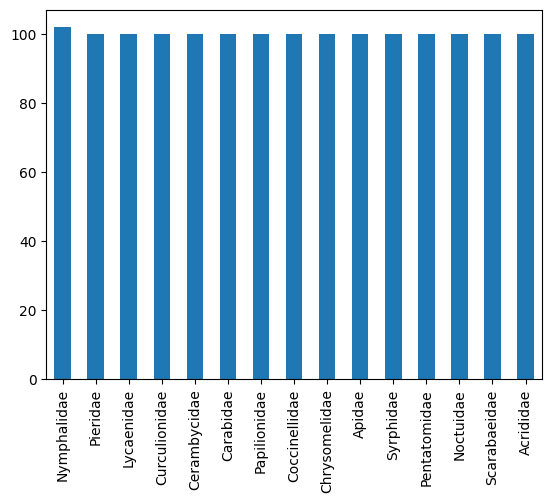

In [ ]:
import pandas as pd
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw


df_tain, test_df = train_test_split(df2, test_size=0.2, random_state=42)

class_counts = df_tain['Familia'].value_counts()
desired_count = 100
new_df = pd.DataFrame(columns=df_tain.columns)
for cls in class_counts.index:
    cls_df = df_tain[df_tain['Familia'] == cls]
    aug = naw.SynonymAug(aug_src='wordnet', lang='spa')
    cls_size = len(cls_df)
    while cls_size < desired_count:
        # Augment a random instance of the class
        idx = cls_df.sample().index[0]
        aug_text = aug.augment(df_tain.loc[idx, 'Descripción'])[0]
        # Add the augmented instance to the new dataframe
        new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
        cls_size += 1
balanced_df = pd.concat([df_tain, new_df], ignore_index=True)

balanced_df['Familia'].value_counts().plot(kind='bar')

In [ ]:
X = balanced_df.Descripción
y = balanced_df.Familia
X_train, y_train = X, y
X_test,y_test = test_df.Descripción,test_df.Familia

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.6470588235294118
               precision    recall  f1-score   support

       Apidae       0.71      0.83      0.77         6
 Pentatomidae       0.50      1.00      0.67         2
    Acrididae       1.00      0.50      0.67         2
Curculionidae       0.37      0.78      0.50         9
    Carabidae       0.78      0.64      0.70        11
 Cerambycidae       1.00      0.67      0.80         6
Coccinellidae       0.60      0.75      0.67         4
Chrysomelidae       0.40      0.86      0.55         7
 Scarabaeidae       0.44      0.57      0.50         7
    Syrphidae       0.92      0.69      0.79        32
    Noctuidae       0.50      0.50      0.50         8
   Lycaenidae       1.00      1.00      1.00         3
  Nymphalidae       0.33      0.25      0.29         4
 Papilionidae       1.00      0.17      0.29        12
     Pieridae       1.00      1.00      1.00         6

     accuracy                           0.65       119
    macro avg       0.70      0.68 

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test.tolist()))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7310924369747899
               precision    recall  f1-score   support

       Apidae       0.86      1.00      0.92         6
 Pentatomidae       0.50      1.00      0.67         2
    Acrididae       1.00      0.50      0.67         2
Curculionidae       0.43      1.00      0.60         9
    Carabidae       0.86      0.55      0.67        11
 Cerambycidae       1.00      0.83      0.91         6
Coccinellidae       0.40      0.50      0.44         4
Chrysomelidae       0.71      0.71      0.71         7
 Scarabaeidae       1.00      0.71      0.83         7
    Syrphidae       0.87      0.84      0.86        32
    Noctuidae       0.50      0.50      0.50         8
   Lycaenidae       0.75      1.00      0.86         3
  Nymphalidae       0.50      0.50      0.50         4
 Papilionidae       1.00      0.33      0.50        12
     Pieridae       1.00      1.00      1.00         6

     accuracy                           0.73       119
    macro avg       0.76      0.73 

In [ ]:
predicted = sgd.decision_function (['joljkljk'])

In [ ]:
predicted

array([[-0.61152279, -0.58943052, -0.57607984, -0.46671189, -0.57968045,
        -0.53880743, -0.56503939, -0.62194505, -0.53520833, -0.50208309,
        -0.53948345, -0.5802406 , -0.56873956, -0.50818717, -0.56805642]])

In [ ]:
import lime
from lime import lime_text
import numpy as np
label_order = nb['clf'].classes_
explainer = lime_text.LimeTextExplainer(class_names=label_order)

def predict_fn(texts):
    return sgd.decision_function(texts)

text_to_explain = X_test[592]


exp = explainer.explain_instance(text_to_explain, predict_fn, num_features=10,top_labels=3)

print('Explanation for the sample text and class :')
print(y_test[592])
exp.show_in_notebook(text=True)

Explanation for the sample text and class :
Cerambycidae


In [ ]:
exp.save_to_file('sgd_augmented_apicidae.html')

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test.tolist()))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7394957983193278
               precision    recall  f1-score   support

       Apidae       0.86      1.00      0.92         6
 Pentatomidae       0.67      1.00      0.80         2
    Acrididae       1.00      0.50      0.67         2
Curculionidae       0.43      1.00      0.60         9
    Carabidae       0.75      0.55      0.63        11
 Cerambycidae       1.00      0.67      0.80         6
Coccinellidae       0.50      0.25      0.33         4
Chrysomelidae       0.80      0.57      0.67         7
 Scarabaeidae       1.00      0.29      0.44         7
    Syrphidae       0.75      0.94      0.83        32
    Noctuidae       0.71      0.62      0.67         8
   Lycaenidae       1.00      1.00      1.00         3
  Nymphalidae       0.67      0.50      0.57         4
 Papilionidae       1.00      0.67      0.80        12
     Pieridae       1.00      0.83      0.91         6

     accuracy                           0.74       119
    macro avg       0.81      0.69 

In [ ]:
X_test.to_list()

In [ ]:
import lime
from lime import lime_text
import numpy as np
label_order = nb['clf'].classes_
explainer = lime_text.LimeTextExplainer(class_names=label_order)

def predict_fn(texts):
    return nb.predict_proba(texts)

text_to_explain = X_test[592]


exp = explainer.explain_instance(text_to_explain, predict_fn, num_features=10,top_labels=3)

print('Explanation for the sample text and class :')
print(y_test[592])
exp.show_in_notebook(text=True)

Explanation for the sample text and class :
Cerambycidae


In [ ]:
exp.save_to_file('nb_augmented_apicidae.html')

In [ ]:
import lime
from lime import lime_text
import numpy as np
label_order = logreg['clf'].classes_

explainer = lime_text.LimeTextExplainer(class_names=label_order)

def predict_fn(texts):
    return logreg.predict_proba(texts)

text_to_explain = X_test[592]


exp = explainer.explain_instance(text_to_explain, predict_fn, num_features=10,top_labels=3)

print('Explanation for the sample text and class :')
print(y_test[592])
exp.show_in_notebook(text=True)

Explanation for the sample text and class :
Cerambycidae


In [ ]:
exp.save_to_file('logreg_augmented_apicidae.html')

In [ ]:
test_df

,Familia,Descripción
1311,Pieridae,blanca meridional muestra vuelo especialmente ...
1602,Coccinellidae,trata especie mariquita color negro grandes ma...
592,Cerambycidae,escarabajo cuerpo abigarrado ancho achaparrado...
529,Nymphalidae,mariposa caracteriza franja roja atraviesa ala...
1451,Scarabaeidae,varias especies cetonidos negros grandes mide ...
...,...,...
1107,Pentatomidae,chinche escudo verde nombre sugiere forma escu...
644,Lycaenidae,alas macho color azul cielo estrecho borde neg...
757,Acrididae,saltamontes tres centimetros longitud habitan ...
615,Scarabaeidae,escarabajo propio selvas humedas malasia prese...


# Con tranformers sin augmented

In [53]:
df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Familia'].unique()

# extract subdataframe selecting columns
df1 = df[['Clase', 'Orden', 'Familia', 'Género', 'Especie', 'Descripción','Superfamilia']]
df1 = df1.reset_index(drop=True)
df1 = df1[df1['Descripción'].notna()]
import re
def limpiar_texto(text):
    text = text.lower()
    text = re.sub(r"á", "a", text)
    text = re.sub(r"é", "e", text)
    text = re.sub(r"í", "i", text)
    text = re.sub(r"ó", "o", text)
    text = re.sub(r"ú", "u", text)
    text = re.sub(r"ñ", "n", text)
    return text
df1['Descripción'] = df1['Descripción'].apply(limpiar_texto)
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    # text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df1['Descripción'] = df1['Descripción'].apply(clean_text)
df1 = df1[df1['Familia'].isin(animal_families)]
df2 = df1[['Familia', 'Descripción']]
df2['Familia'].value_counts()

X = df2.Descripción
y = df2.Familia
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)



In [ ]:
df1

,Clase,Orden,Familia,Género,Especie,Descripción,Superfamilia
121,Insecta,Hymenoptera,Apidae,Apis,mellifera,se trata de un insecto de color pardo oscuro ...,Apoidea
162,Insecta,Hemiptera,Pentatomidae,Codophila,varia,los ejemplares de estas chinches varian mucho ...,Pentatomoidea
163,Insecta,Hemiptera,Pentatomidae,Pentatoma,rufipes,esta chinche alcanza el centimetro y medio de ...,Pentatomoidea
165,Insecta,Hemiptera,Pentatomidae,Eurydema,oleraceum,la coloracion de esta chinche es realmente fas...,Pentatomoidea
168,Insecta,Hemiptera,Pentatomidae,Picromerus,bidens,el escudete dorsal de esta chinche esta adorna...,Pentatomoidea
...,...,...,...,...,...,...,...
1602,Insecta,Coleoptera,Coccinellidae,Hyperaspis,illecebrosa,se trata de una especie de mariquita de color ...,Cucujoidea
1606,Insecta,Diptera,Syrphidae,Eristalis,pertinax,este sirfido es muy similar a la mosca zangano...,Syrphoidea
1607,Insecta,Diptera,Syrphidae,Eristalis,interrupta,el ala de estos sirfidos mide entre 8 y 10 mil...,Syrphoidea
1619,Insecta,Coleoptera,Chrysomelidae,Cassida,rubiginosa,la casida de los cardos es de color verde bril...,Chrysomeloidea


In [ ]:
# get a new column called label with numeric values for the column facultades
df2['label'] = df2['Familia'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df2, test_size=0.2, random_state=42)

<ipython-input-211-0f86d3064051>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['label'] = df2['Familia'].astype('category').cat.codes


In [ ]:
train_texts, train_labels = train['Descripción'].tolist(), train['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [ ]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2, random_state=42)

In [ ]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [ ]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [ ]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
id2label = dict(zip(df2['label'].unique(),df2['Familia'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [ ]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=15,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.dense.weight', 'lm_head.decoder.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.dense.weight', 'classifie

device(type='cuda', index=0)

In [ ]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)




In [ ]:
from transformers import TrainingArguments, Trainer
from torch import nn
from sklearn.utils import class_weight

training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=6,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy
1,2.620100,2.522722,0.210526
2,2.409600,2.241491,0.326316
3,1.983100,1.862744,0.473684
4,1.601200,1.686285,0.494737
5,1.334100,1.597433,0.536842
6,1.177800,1.579009,0.536842


TrainOutput(global_step=288, training_loss=1.8543302218119304, metrics={'train_runtime': 74.0079, 'train_samples_per_second': 30.645, 'train_steps_per_second': 3.891, 'total_flos': 596805525614592.0, 'train_loss': 1.8543302218119304, 'epoch': 6.0})

In [ ]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

('CustomModels/robertabne_trained_on_insectos_orden_aug/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug/tokenizer.json')

In [ ]:
# load the model
device='cuda'
from datasets import Dataset
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification, pipeline
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug")

In [ ]:
test_df = test_df.rename(columns={'Descripción': 'text'})
test_df['label'] = test_df['Familia'].map(label2id)
dataset = Dataset.from_pandas(test_df[['text','label']])


In [ ]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden_aug")

In [ ]:
tokenizer = load_tokenizer
model = load_model

In [ ]:
label = []
results = []
for index,row in test.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['Descripción'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [ ]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'precision': 0.606169740623522}
{'f1': 0.484050657299957}
{'recall': 0.5462184873949579}
{'accuracy': 0.5462184873949579}


In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import MultiLabelClassificationExplainer

model = AutoModelForSequenceClassification.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug')
# tokenizer = AutoTokenizer.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug4')


cls_explainer = MultiLabelClassificationExplainer(model, tokenizer)




In [ ]:
word_attributions = cls_explainer("""escarabajo de cuerpo abigarrado ancho achaparrado con unas graciles antenas artejos coloreados igual patas alternativamente azul negro""")

KeyboardInterrupt: ignored

In [ ]:
cls_explainer.visualize(true_class='Cerambycidae')

In [ ]:
cls_explainer.visualize('roberta_no_aug.html',true_class='Cerambycidae')

# familias con augmented
---



In [54]:
df2

,Familia,Descripción
121,Apidae,se trata de un insecto de color pardo oscuro ...
162,Pentatomidae,los ejemplares de estas chinches varian mucho ...
163,Pentatomidae,esta chinche alcanza el centimetro y medio de ...
165,Pentatomidae,la coloracion de esta chinche es realmente fas...
168,Pentatomidae,el escudete dorsal de esta chinche esta adorna...
...,...,...
1602,Coccinellidae,se trata de una especie de mariquita de color ...
1606,Syrphidae,este sirfido es muy similar a la mosca zangano...
1607,Syrphidae,el ala de estos sirfidos mide entre 8 y 10 mil...
1619,Chrysomelidae,la casida de los cardos es de color verde bril...


In [55]:
# get a new column called label with numeric values for the column facultades
df2['label'] = df2['Familia'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df2, test_size=0.2, random_state=42)

<ipython-input-55-0f86d3064051>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['label'] = df2['Familia'].astype('category').cat.codes


In [ ]:
df1

,Clase,Orden,Familia,Género,Especie,Descripción,Superfamilia
121,Insecta,Hymenoptera,Apidae,Apis,mellifera,trata insecto color pardo oscuro tamano aproxi...,Apoidea
162,Insecta,Hemiptera,Pentatomidae,Codophila,varia,ejemplares chinches varian tamano colorido tam...,Pentatomoidea
163,Insecta,Hemiptera,Pentatomidae,Pentatoma,rufipes,chinche alcanza centimetro medio longitud prin...,Pentatomoidea
165,Insecta,Hemiptera,Pentatomidae,Eurydema,oleraceum,coloracion chinche realmente fascinante fondo ...,Pentatomoidea
168,Insecta,Hemiptera,Pentatomidae,Picromerus,bidens,escudete dorsal chinche adornado dos puntos ro...,Pentatomoidea
...,...,...,...,...,...,...,...
1602,Insecta,Coleoptera,Coccinellidae,Hyperaspis,illecebrosa,trata especie mariquita color negro grandes ma...,Cucujoidea
1606,Insecta,Diptera,Syrphidae,Eristalis,pertinax,sirfido similar mosca zangano macho abdomen cl...,Syrphoidea
1607,Insecta,Diptera,Syrphidae,Eristalis,interrupta,ala sirfidos mide 8 10 milimetros hialina pres...,Syrphoidea
1619,Insecta,Coleoptera,Chrysomelidae,Cassida,rubiginosa,casida cardos color verde brillante amarillo v...,Chrysomeloidea


<ipython-input-56-08408a8b4767>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-56-08408a8b4767>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-56-08408a8b4767>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-56-08408a8b4767>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': c

<Axes: >

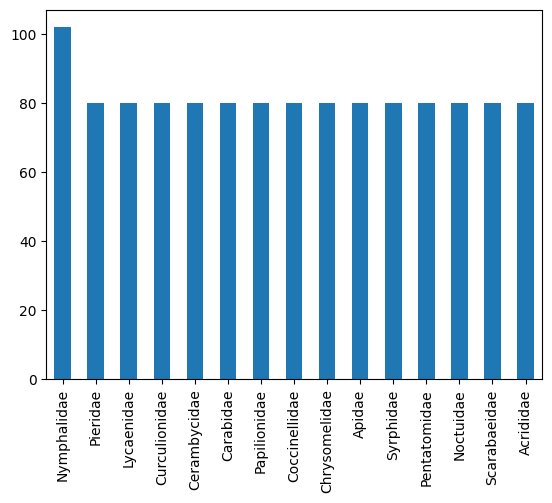

In [56]:
import pandas as pd
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw

class_counts = train['Familia'].value_counts()
desired_count = 80
new_df = pd.DataFrame(columns=train.columns)
for cls in class_counts.index:
    cls_df = train[train['Familia'] == cls]
    aug = naw.SynonymAug(aug_src='wordnet', lang='spa')
    cls_size = len(cls_df)
    while cls_size < desired_count:
        # Augment a random instance of the class
        idx = cls_df.sample().index[0]
        aug_text = aug.augment(train.loc[idx, 'Descripción'])[0]
        # Add the augmented instance to the new dataframe
        new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
        cls_size += 1
balanced_df = pd.concat([train, new_df], ignore_index=True)

balanced_df['Familia'].value_counts().plot(kind='bar')

In [57]:
balanced_df['label'] = balanced_df['Familia'].astype('category').cat.codes

In [58]:
train_texts, train_labels = balanced_df['Descripción'].tolist(), balanced_df['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [59]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2)

In [60]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [61]:
train_texts

['esta esplendida mariposa solo puede encontrarse en las selvas de nueva guinea papua y en las islas salomon siempre volando por encima de la cobertura vegetal mas alta presenta unas grandes alas de asentaderas negro con una mancha central verde y manchas amarillas en los bordes tanto delanteros como traseros',
 'se trata de un escarabajo longicornio de aspecto esbelto y de coloracion uniformemente negra con una pubescencia grisacea la larva vive sobre diversas compuestas como la hierba pagana solidago hierba de san juan artemisa crisantemos chrysanthemun y tanaceto tanacetum se distribuye por europa central hasta rusia occidental y los pirineos rev junio08',
 'estos gorgojos no tienen el hocico tan largo y estrecho como otros miembros de su familia aunque si que presentan las tipicas antenas acodadas miden cerca de medio centimetro de tamano no tienen espinas en los femures de las patas el color de traste es rojizo y sobre el presentan finas escamas de apariencia verde iridiscente que

In [62]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [63]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [64]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [65]:
id2label = dict(zip(df2['label'].unique(),df2['Familia'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [66]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=15,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.decoder.bias', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.dense.weight', 'classifie

device(type='cuda', index=0)

In [67]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)




In [68]:
from transformers import TrainingArguments, Trainer
from torch import nn
from sklearn.utils import class_weight

training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=6,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy
1,2.022500,1.210386,0.567347
2,0.919900,0.730992,0.832653
3,0.469900,0.456369,0.906122
4,0.203200,0.322469,0.938776
5,0.082000,0.297287,0.922449
6,0.050400,0.283931,0.926531


TrainOutput(global_step=738, training_loss=0.6246495324421705, metrics={'train_runtime': 195.9467, 'train_samples_per_second': 29.916, 'train_steps_per_second': 3.766, 'total_flos': 1542537033136128.0, 'train_loss': 0.6246495324421705, 'epoch': 6.0})

In [69]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug2")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug2")

('CustomModels/robertabne_trained_on_insectos_orden_aug2/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug2/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug2/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug2/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden_aug2/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug2/tokenizer.json')

In [70]:
# load the model
device='cuda'
from datasets import Dataset
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification, pipeline
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug2")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug2")

In [71]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden_aug2")

In [72]:
tokenizer = load_tokenizer
model = load_model

In [73]:
label = []
results = []
for index,row in test.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['Descripción'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [74]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




{'precision': 0.71687367028923}


{'f1': 0.6892929007610175}


{'recall': 0.6974789915966386}
{'accuracy': 0.6974789915966386}


In [76]:
pip install transformers-interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.1 MB/s eta 0:00:00


In [77]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import MultiLabelClassificationExplainer

model = AutoModelForSequenceClassification.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug2')
# tokenizer = AutoTokenizer.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug4')


cls_explainer = MultiLabelClassificationExplainer(model, tokenizer)




In [83]:
test

,Familia,Descripción,label
1311,Pieridae,la blanca meridional muestra un vuelo especial...,12
1602,Coccinellidae,se trata de una especie de mariquita de color ...,5
592,Cerambycidae,es este un escarabajo de cuerpo abigarrado an...,3
529,Nymphalidae,esta mariposa se caracteriza por la franja roj...,9
1451,Scarabaeidae,es una de las varias especies de cetonidos neg...,13
...,...,...,...
1107,Pentatomidae,la chinche de escudo verde tiene como su nomb...,11
644,Lycaenidae,las alas del macho son de color azul cielo co...,7
757,Acrididae,estos saltamontes de hasta tres centimetros de...,0
615,Scarabaeidae,este escarabajo propio de las selvas humedas d...,13


In [84]:
word_attributions = cls_explainer("""se trata de una especie de mariquita de color negro con grandes manchas rojo intenso o naranja tanto en la parte anterior de la cabeza y del pronoto como sobre la parte posterior de los elitros que estan truncados en el extremo de forma olbicua tiene forma ovalada un tanto alargada y convexa se trata de un endemismo iberico presente en toda la peninsula rev junio17 """)

In [85]:
cls_explainer.visualize('escarabajo_robert.html',true_class='Cerambycidae')

# familias con augmented

In [35]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Familia'].unique()

# extract subdataframe selecting columns
df1 = df[['Clase', 'Orden', 'Familia', 'Género', 'Especie', 'Descripción','Superfamilia']]
df1 = df1.reset_index(drop=True)
df1 = df1[df1['Descripción'].notna()]

In [ ]:
a = ['Nymphalidae',
 'Cerambycidae',
 'Scarabaeidae',
 'Papilionidae',
 'Chrysomelidae',
 'Noctuidae',
 'Lycaenidae',
 'Syrphidae',
 'Pieridae',
 'Pentatomidae',
 'Acrididae',
 'Curculionidae',
 'Carabidae',
 'Coccinellidae',
 'Apidae']

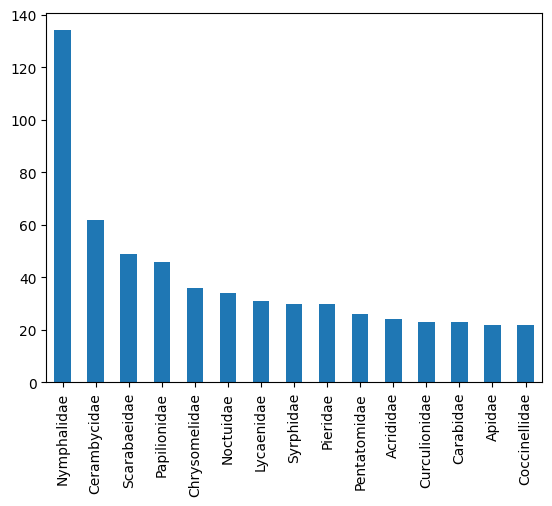

In [ ]:
import re
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('spanish'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    return text

df = pd.read_excel('/content/drive/MyDrive/animales.xlsx')
df = df[df['Phylum']=='Arthropoda']
df['Descripción'] = df['Descripción'].apply(clean_text)
df1 = df1[df1['Familia'].isin(a)]
df2 = df1[['Familia', 'Descripción']]
df2['Familia'].value_counts()

# # divide the string in the column Descripcion in half and store the second half in the column Descripcion2
# for index, row in df1.iterrows():
#     if row['Clase'] == 'Arachnida':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)
#     if row['Clase'] == 'Malacostraca':
#         num = int(len(row['Descripción'])/2)
#         texto1 = row['Descripción'][:num]
#         texto2 = row['Descripción'][num:]
#         df2.at[index, 'Descripción'] = texto1
#         # print(len(texto1), len(df2.at[index, 'Descripción']))
#         # append a new row to df2 with texto2
#         df2 = df2.append({'Clase': row['Clase'], 'Descripción': texto2}, ignore_index=True)

        



# plot the number of elements in column Clase
df2['Familia'].value_counts().plot(kind='bar')
df1 = df2

<ipython-input-65-a8d3088302d4>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-65-a8d3088302d4>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-65-a8d3088302d4>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
<ipython-input-65-a8d3088302d4>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append({'Descripción': aug_text, 'Familia': c

<Axes: >

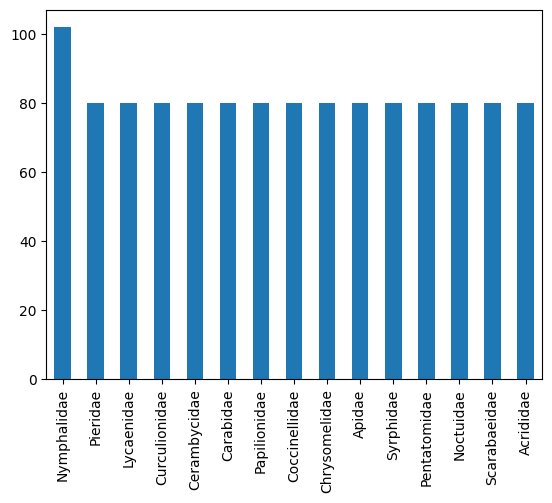

In [ ]:
import pandas as pd
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw


df_tain, test_df = train_test_split(df2, test_size=0.2, random_state=42)

class_counts = df_tain['Familia'].value_counts()
desired_count = 80
new_df = pd.DataFrame(columns=df_tain.columns)
for cls in class_counts.index:
    cls_df = df_tain[df_tain['Familia'] == cls]
    aug = naw.SynonymAug(aug_src='wordnet', lang='spa')
    cls_size = len(cls_df)
    while cls_size < desired_count:
        # Augment a random instance of the class
        idx = cls_df.sample().index[0]
        aug_text = aug.augment(df_tain.loc[idx, 'Descripción'])[0]
        # Add the augmented instance to the new dataframe
        new_df = new_df.append({'Descripción': aug_text, 'Familia': cls}, ignore_index=True)
        cls_size += 1
balanced_df = pd.concat([df_tain, new_df], ignore_index=True)

balanced_df['Familia'].value_counts().plot(kind='bar')

In [ ]:
test_df

,Familia,Descripción
1311,Pieridae,La blanca meridional muestra un vuelo espec...
1602,Coccinellidae,Se trata de una especie de mariquita de col...
592,Cerambycidae,"Es este un escarabajo de cuerpo abigarrado,..."
529,Nymphalidae,Esta mariposa se caracteriza por la franja ...
1451,Scarabaeidae,Es una de las varias especies de cetónidos ...
...,...,...
1107,Pentatomidae,"La chinche de escudo verde tiene, como su n..."
644,Lycaenidae,"Las alas del macho son de color azul cielo,..."
757,Acrididae,Estos saltamontes de hasta tres centímetros...
615,Scarabaeidae,Este escarabajo propio de las selvas húmeda...


<Axes: >

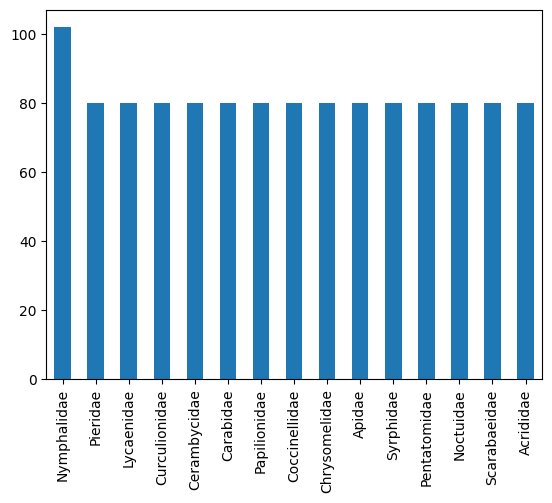

In [ ]:
balanced_df['Familia'].value_counts().plot(kind='bar')

In [ ]:
df2['Familia'].value_counts()

Nymphalidae      134
Cerambycidae      62
Scarabaeidae      49
Papilionidae      46
Chrysomelidae     36
Noctuidae         34
Lycaenidae        31
Syrphidae         30
Pieridae          30
Pentatomidae      26
Acrididae         24
Curculionidae     23
Carabidae         23
Apidae            22
Coccinellidae     22
Name: Familia, dtype: int64

In [ ]:
df1=balanced_df
X = df1.Descripción
y = df1.Familia
X_train, y_train = X, y
X_test,y_test = test_df.Descripción,test_df.Familia

In [ ]:
X = df1.Descripción
y = df1.Familia
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

nb = Pipeline([('vect', CountVectorizer()),
               ('tfidf', TfidfTransformer()),
               ('clf', MultinomialNB()),
              ])
nb.fit(X_train, y_train)


from sklearn.metrics import classification_report
y_pred = nb.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.8555858310626703
               precision    recall  f1-score   support

  Nymphalidae       0.95      1.00      0.97        19
     Pieridae       0.87      1.00      0.93        20
   Lycaenidae       0.82      0.96      0.88        24
Curculionidae       0.88      0.92      0.90        24
 Cerambycidae       1.00      0.86      0.93        29
    Carabidae       0.91      1.00      0.95        20
 Papilionidae       0.95      0.87      0.91        23
Coccinellidae       0.76      1.00      0.86        19
Chrysomelidae       1.00      0.47      0.64        30
       Apidae       0.49      0.97      0.65        32
    Syrphidae       1.00      0.64      0.78        28
 Pentatomidae       1.00      1.00      1.00        23
    Noctuidae       1.00      0.73      0.84        26
 Scarabaeidae       1.00      0.70      0.82        23
    Acrididae       1.00      0.93      0.96        27

     accuracy                           0.86       367
    macro avg       0.91      0.87 

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)),
               ])
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7640449438202247
               precision    recall  f1-score   support

       Apidae       0.86      0.86      0.86         7
 Pentatomidae       0.86      1.00      0.92         6
    Acrididae       0.40      0.50      0.44         4
Curculionidae       0.68      1.00      0.81        17
    Carabidae       0.77      0.71      0.74        14
 Cerambycidae       1.00      0.88      0.93         8
Coccinellidae       0.75      0.43      0.55         7
Chrysomelidae       0.67      0.44      0.53         9
 Scarabaeidae       1.00      0.50      0.67        10
    Syrphidae       0.76      0.89      0.82        47
    Noctuidae       0.54      0.58      0.56        12
   Lycaenidae       1.00      1.00      1.00         4
  Nymphalidae       0.62      0.56      0.59         9
 Papilionidae       0.91      0.62      0.74        16
     Pieridae       1.00      1.00      1.00         8

     accuracy                           0.76       178
    macro avg       0.79      0.73 

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline([('vect', CountVectorizer()),
                ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(n_jobs=1, C=1e5)),
               ])
logreg.fit(X_train, y_train)


y_pred = logreg.predict(X_test)

print('accuracy %s' % accuracy_score(y_pred, y_test))
print(classification_report(y_test, y_pred,target_names=df1.Familia.unique()))

accuracy 0.7471910112359551
               precision    recall  f1-score   support

       Apidae       0.86      0.86      0.86         7
 Pentatomidae       0.86      1.00      0.92         6
    Acrididae       0.40      0.50      0.44         4
Curculionidae       0.53      1.00      0.69        17
    Carabidae       0.89      0.57      0.70        14
 Cerambycidae       1.00      0.75      0.86         8
Coccinellidae       0.75      0.43      0.55         7
Chrysomelidae       0.75      0.67      0.71         9
 Scarabaeidae       1.00      0.40      0.57        10
    Syrphidae       0.76      0.96      0.85        47
    Noctuidae       0.58      0.58      0.58        12
   Lycaenidae       0.75      0.75      0.75         4
  Nymphalidae       1.00      0.33      0.50         9
 Papilionidae       0.90      0.56      0.69        16
     Pieridae       1.00      1.00      1.00         8

     accuracy                           0.75       178
    macro avg       0.80      0.69 

In [ ]:
# get a new column called label with numeric values for the column facultades
df1['label'] = df1['Familia'].astype('category').cat.codes
# divide the dataframe in train and test aroun 80 20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(df1, test_size=0.2, random_state=42)

In [ ]:
train_texts, train_labels = train['Descripción'].tolist(), train['label'].tolist()
test_texts, test_labels = test['Descripción'].tolist(), test['label'].tolist()

In [ ]:
X_test

231        Esta chinche puede encontrarse en primavera...
422        Se trata de un característico escarabajo, d...
43         Es este un escarabajo de color negro mate, ...
1007    Se trata de una abeja que deposita sus huevos ...
552     Se trata de escarabajos bastante grandes, de u...
                              ...                        
2          La parte superior de las alas de esta marip...
6                 Se trata de una mariposa estrechamen...
311        Los adultos de estos lepidópteros miden de ...
1049    Este hermoso gorgojo mide de tres a cuatro mil...
846     Los machos de esta especie de sírfido se ident...
Name: Descripción, Length: 367, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split
train_texts, val_texts, train_labels, val_labels = train_test_split(train_texts, train_labels, test_size=.2)

In [ ]:
from transformers import AutoTokenizer
    
tokenizer = AutoTokenizer.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', use_fast=True)

In [ ]:
train_encodings = tokenizer(train_texts, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, truncation=True, padding=True)
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

In [ ]:
import torch

class insectos_dataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = insectos_dataset(train_encodings, train_labels)
val_dataset = insectos_dataset(val_encodings, val_labels)
test_dataset = insectos_dataset(test_encodings, test_labels)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
id2label = dict(zip(df1['label'].unique(),df1['Familia'].unique()))
label2id = {v: int(k) for k, v in id2label.items()}
# change type key to int
id2label = {int(k): v for k, v in id2label.items()}

In [ ]:
from transformers import AutoModelForSequenceClassification,RobertaForSequenceClassification
model = AutoModelForSequenceClassification.from_pretrained('PlanTL-GOB-ES/roberta-base-bne', num_labels=15,id2label=id2label, label2id=label2id).to('cuda')
model.device

Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaForSequenceClassification: ['lm_head.dense.weight', 'lm_head.decoder.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['classifier.dense.weight', 'classifie

device(type='cuda', index=0)

In [ ]:
from datasets import load_metric
metric = load_metric('accuracy')

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)

In [ ]:
!pip install --upgrade accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 8.1 MB/s eta 0:00:00


In [ ]:
!pip install transformers==4.28.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from transformers import TrainingArguments, Trainer
torch.cuda.empty_cache()
training_args = TrainingArguments(
    output_dir='./results_roberta',
    learning_rate=2e-5,
    per_device_train_batch_size=12,
    per_device_eval_batch_size=12,
    num_train_epochs=10,
    weight_decay=0.01,
    evaluation_strategy = "epoch", #To calculate metrics per epoch
    logging_strategy="epoch", #Extra: to log training data stats for loss 
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()


/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy
1,2.410400,1.663269,0.612245
2,1.232100,1.012554,0.729592
3,0.664800,0.716378,0.826531
4,0.356100,0.515189,0.877551
5,0.177000,0.450691,0.877551
6,0.082900,0.396060,0.882653
7,0.048900,0.334706,0.908163
8,0.035700,0.334174,0.908163
9,0.030400,0.333551,0.908163
10,0.028200,0.333481,0.908163


TrainOutput(global_step=660, training_loss=0.5066603295730822, metrics={'train_runtime': 249.2195, 'train_samples_per_second': 31.338, 'train_steps_per_second': 2.648, 'total_flos': 2055137193584640.0, 'train_loss': 0.5066603295730822, 'epoch': 10.0})

In [ ]:
model.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug4")

# alternatively save the trainer
# trainer.save_model("CustomModels/CustomHamSpam")

tokenizer.save_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug4")

('CustomModels/robertabne_trained_on_insectos_orden_aug4/tokenizer_config.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug4/special_tokens_map.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug4/vocab.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug4/merges.txt',
 'CustomModels/robertabne_trained_on_insectos_orden_aug4/added_tokens.json',
 'CustomModels/robertabne_trained_on_insectos_orden_aug4/tokenizer.json')

In [ ]:
# load the model
device='cuda'
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer
load_model = AutoModelForSequenceClassification.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug4")
load_tokenizer = AutoTokenizer.from_pretrained("CustomModels/robertabne_trained_on_insectos_orden_aug4")

In [ ]:
test_df = test_df.rename(columns={'Descripción': 'text'})
test_df['label'] = test_df['Familia'].map(label2id)
dataset = Dataset.from_pandas(test_df[['text','label']])


NameError: ignored

In [ ]:
from datasets import Dataset
test = test.rename(columns={'Descripción': 'text'})
dataset = Dataset.from_pandas(test[['text','label']])

In [ ]:
classifier = pipeline("text-classification", model="CustomModels/robertabne_trained_on_insectos_orden_aug4")

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <cell line: 1>:1                                                                              │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'pipeline' is not defined

In [ ]:
pip install transformers-interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.2 MB/s eta 0:00:00


In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from transformers_interpret import MultiLabelClassificationExplainer

model = AutoModelForSequenceClassification.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug4')
# tokenizer = AutoTokenizer.from_pretrained('CustomModels/robertabne_trained_on_insectos_orden_aug4')


cls_explainer = MultiLabelClassificationExplainer(model, tokenizer)




In [ ]:
word_attributions = cls_explainer(""" Este escarabajo de largas antenas
 es una especie muy comun en Europa, donde se desarrolla sobre una gran variedad
  de plantas herbaceas.
Alcanzan los 15 milimetros de tamaño. Los elitros, y todo el cuerpo, aparecen
cubiertos de una vellosidad muy corta, aterciopelada, de coloración verdosa amarillenta iridiscente.""")

In [ ]:
cls_explainer.visualize(true_class=)

In [ ]:
word_attributions

In [ ]:
 word_attributions = cls_explainer("""Esta mosca presenta el cuerpo cubierto de un tupido pelaje de color pardo dorado, imitando a un pequeño abejorro, pero si nos fijamos un poco más, veremos que sólamente tiene un par de alas y un par de balancines posteriores, además tienen las patas delgadas y desprovistas de pelo. Mide aproximadamente un centímetros de tamaño.

Su parecido se ve acentuado también por su aparente vuelo cernido sobre las flores, sin embargo, este insecto suele estar agarrado a la flor con un par de patas.

Aparece prácticamente en todas las tierras emergidas del hemisferio norte, siendo muy corriente en los linderos de los bosques y en los parques y jardines. """)
 
 cls_explainer.visualize()
 

In [ ]:
word_attributions

{'Acrididae': [('<s>', 0.0),
  ('escar', 0.02018813031846442),
  ('abajo', 0.5079368817205562),
  ('grande', 0.11277790810363714),
  ('y', -0.2988014682777042),
  ('llamativo', 0.0457960697045852),
  ('', 0.04718818883338143),
  (',', 0.008447170700572965),
  ('con', 0.07152644529499617),
  ('un', -0.016482392117017793),
  ('cuerpo', 0.16572325781244054),
  ('alar', -0.007981033644183835),
  ('gado', 0.021577320626843324),
  ('de', -0.09308692367602328),
  ('color', 0.06920562941924838),
  ('negro', 0.060668878160257705),
  ('brillante', 0.05747538861186318),
  ('', -0.03658612513311505),
  (',', -0.03628447839117358),
  ('seg', 0.09803239793244274),
  ('mentado', 0.03429504356046886),
  ('y', 0.018381244098726237),
  ('con', -0.014319987919211642),
  ('manchas', -0.030690966985068905),
  ('o', 0.011086145671628763),
  ('rayas', 0.10265541289231159),
  ('blancas', 0.00923291322877163),
  ('o', -0.058010356432780276),
  ('amarillas', 0.06570153709993325),
  ('', -0.09299982987816124),
 

In [ ]:
import re
def limpiar_texto(text):
    text = text.lower()
    # print(text)
    text = re.sub(r"á", "a", text)
    text = re.sub(r"é", "e", text)
    text = re.sub(r"í", "i", text)
    text = re.sub(r"ó", "o", text)
    text = re.sub(r"ú", "u", text)
    text = re.sub(r"ñ", "n", text)
    return text

In [ ]:
for index,row in test_df[0:5].iterrows():
  familia = row['Familia']
  texto = row['Descripción']
  texto = limpiar_texto(texto)
  texto = clean_text(texto)
  print(texto)

blanca meridional muestra vuelo especialmente vacilante puede ser suficiente caracterizarla frente especies similares alimenta flores semillas plantas diversos generos jaramago sinapis hierba anteojos biscutella rabano raphanus collejon moricandia cestillo iberis hierba pastel isatis zona distribucion comprende noroeste africa peninsula iberica sureste francia noroeste italia parece ser tambien presente egipto rev septiembre09
trata especie mariquita color negro grandes manchas rojo intenso naranja parte anterior cabeza pronoto parte posterior elitros estan truncados extremo forma olbicua forma ovalada alargada convexa trata endemismo iberico presente toda peninsula rev junio17
escarabajo cuerpo abigarrado ancho achaparrado unas graciles antenas artejos coloreados igual patas alternativamente azul negro
mariposa caracteriza franja roja atraviesa alas orla finamente punteada traseras supera cinco centimetros envergadura cara inferior alas presenta colores grisaceos ocres aunque anterior

In [ ]:
for index,row in test_df[0:5].iterrows():
  familia = row['Familia']
  texto = row['Descripción']
  texto = clean_text(texto)
  word_attributions = cls_explainer(texto)
  cls_explainer.visualize(true_class=familia)
  cls_explainer.visualize(familia+'.html',true_class=familia)

In [ ]:
 word_attributions = cls_explainer(""" escarabajo grande con antelas largas. escarabajo negro con grandes mandibulas. Maqiruita roja con puntos come pulgones. Mariposa grande de alas amarillas. Gorgojo azulado con boca alargada.
 Abeja blanca y negra muy peluda.  """)
 
 cls_explainer.visualize()

In [ ]:

 
 word_attributions = cls_explainer(""" escarabajo grande y llamativo, con un cuerpo alargado de color negro brillante,
  segmentado y con manchas o rayas blancas o amarillas.
  Sus antenas son largas y delgadas, y las patas son robustas, adaptadas para trepar.
   Es conocido por su tamaño y apariencia distintiva, siendo un insecto notable en el reino animal. """,)
 
 cls_explainer.visualize()

In [ ]:
test_df

,Familia,Descripción
1311,Pieridae,La blanca meridional muestra un vuelo espec...
1602,Coccinellidae,Se trata de una especie de mariquita de col...
592,Cerambycidae,"Es este un escarabajo de cuerpo abigarrado,..."
529,Nymphalidae,Esta mariposa se caracteriza por la franja ...
1451,Scarabaeidae,Es una de las varias especies de cetónidos ...
...,...,...
1107,Pentatomidae,"La chinche de escudo verde tiene, como su n..."
644,Lycaenidae,"Las alas del macho son de color azul cielo,..."
757,Acrididae,Estos saltamontes de hasta tres centímetros...
615,Scarabaeidae,Este escarabajo propio de las selvas húmeda...


In [ ]:
test

,Familia,Descripción,label
231,Pentatomidae,Esta chinche puede encontrarse en primavera...,11
422,Scarabaeidae,"Se trata de un característico escarabajo, d...",13
43,Scarabaeidae,"Es este un escarabajo de color negro mate, ...",13
1007,Apidae,Las abejas de este género son conocidas por de...,1
552,Scarabaeidae,"Es este un escarabajo de color negro mate, con...",13
...,...,...,...
465,Scarabaeidae,Este gran escarabajo puede alcanzar los 4 c...,13
865,Pentatomidae,La coloración de esta chinche es realmente fas...,11
743,Chrysomelidae,Este escarabajo es una importante plaga de los...,4
303,Acrididae,Este animal se caracteriza por su cabeza có...,0


In [ ]:
test_df

,Familia,Descripción
1311,Pieridae,La blanca meridional muestra un vuelo espec...
1602,Coccinellidae,Se trata de una especie de mariquita de col...
592,Cerambycidae,"Es este un escarabajo de cuerpo abigarrado,..."
529,Nymphalidae,Esta mariposa se caracteriza por la franja ...
1451,Scarabaeidae,Es una de las varias especies de cetónidos ...
...,...,...
1107,Pentatomidae,"La chinche de escudo verde tiene, como su n..."
644,Lycaenidae,"Las alas del macho son de color azul cielo,..."
757,Acrididae,Estos saltamontes de hasta tres centímetros...
615,Scarabaeidae,Este escarabajo propio de las selvas húmeda...


In [ ]:
label = []
results = []
for index,row in test.iterrows():
  label.append(row['label'])
  inputs = tokenizer(row['Descripción'], return_tensors="pt",padding = True,truncation=True)
  with torch.no_grad():
      logits = model(**inputs).logits
  predicted_class_id = logits.argmax().item()
  results.append(predicted_class_id)



In [ ]:
val

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <cell line: 1>:1                                                                              │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'val' is not defined

In [ ]:
metric = load_metric('precision')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('f1')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('recall')
print(metric.compute(predictions=results, references=label, average="weighted"))

metric = load_metric('accuracy')
print(metric.compute(predictions=results, references=label))




{'precision': 0.9358461040093693}


{'f1': 0.931053488599297}


{'recall': 0.9306122448979591}
{'accuracy': 0.9306122448979591}
